# ERP analysis using ICA For Eye blink and channel noise and Peak to peak amplitude for the Epoch selection   ; For subject SD031; SD030, SD025, SD020 and SD015

In [1]:
# read the data
import matplotlib.pyplot as plt
import numpy as np
#import pandas as pd
import matplotlib

import mne
import os
from mne.preprocessing import ICA

In [2]:
## Some of the common function 
def identify_bad_channels(data, threshold=80e-6):
    """
    Identify bad channels based on amplitude difference exceeding the threshold.
    
    :param data: 3D array of shape (n_epochs, n_channels, n_times)
    :param threshold: Amplitude difference threshold in Volts (default: 80 microvolts)
    :return: List of bad channel indices
    """
    amplitude_diff = np.ptp(data, axis=2)  # peak-to-peak amplitude for each epoch and channel
    bad_channels = np.where(np.any(amplitude_diff > threshold, axis=0))[0]
    return bad_channels.tolist()


def remove_epochs_with_bad_mmn_channels(epochs, mmn_channels, amplitude_threshold=80e-6):
    """
    Remove epochs where MMN-related channels exceed the amplitude threshold.
    
    :param epochs: mne.Epochs object
    :param mmn_channels: List of MMN channel names
    :param amplitude_threshold: Amplitude difference threshold in Volts (default: 80 microvolts)
    :return: mne.Epochs object with bad epochs removed
    """
    data = epochs.get_data()
    bad_channels = identify_bad_channels(data, amplitude_threshold)
    
    bad_mmn_epochs = []
    for epoch_idx in range(len(epochs)):
        epoch_data = data[epoch_idx]
        epoch_bad_channels = identify_bad_channels(epoch_data[np.newaxis, :, :], amplitude_threshold)
        
        for ch_idx in epoch_bad_channels:
            ch_name = epochs.ch_names[ch_idx]
            if any(mmn_ch in ch_name for mmn_ch in mmn_channels):
                bad_mmn_epochs.append(epoch_idx)
                break
    
    good_epochs = np.setdiff1d(np.arange(len(epochs)), bad_mmn_epochs)
    return epochs[good_epochs]



In [3]:

data_folder = r"D:\Work_data\Notification_evoked_response\Data_at_IITD/"
subjects = os.listdir(data_folder)
data_type = "EEG"
 # it is useful to scroll eeg data 
%matplotlib qt

### Subject SD031 analysis

In [35]:
subject = "SD031"
path = os.path.join(data_folder,subject,data_type)
for eeg in os.listdir(path):
    if eeg[-5:] == ".vhdr":
            break

the default scaling of 20e-6 (20µV) for EEG signals means that the visualized range will be 40 µV (20 µV in the positive direction and 20 µV in the negative direction).

Extracting parameters from D:\Work_data\Notification_evoked_response\Data_at_IITD/SD031\EEG\SD031.vhdr...
Setting channel info structure...
Reading 0 ... 2373159  =      0.000 ...  2373.159 secs...


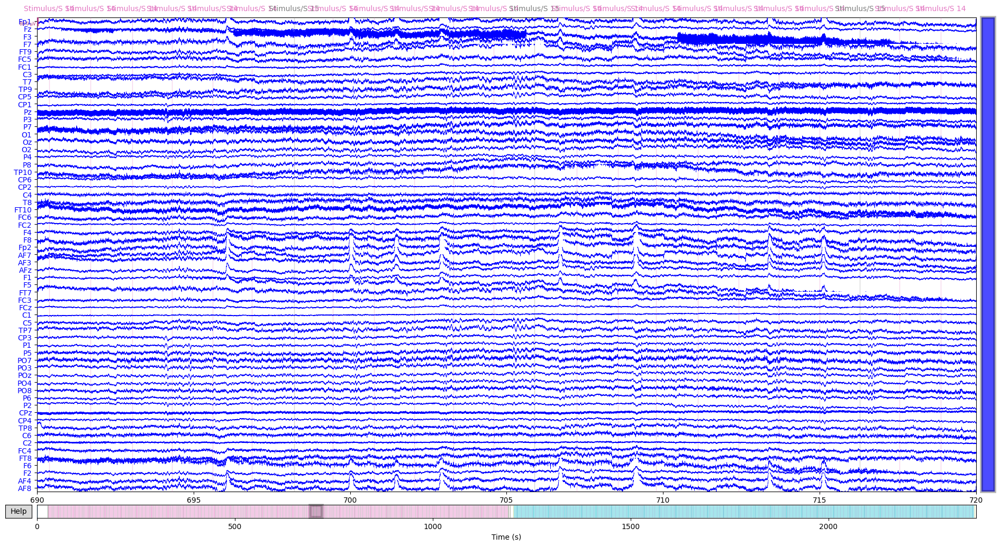

Channels marked as bad:
none


In [36]:
raw = mne.io.read_raw_brainvision(os.path.join(path,eeg), preload=True)
raw.set_montage("easycap-M1")
raw.plot(scalings=dict(eeg=40e-6),clipping='transparent',duration=30.0, start=690.0, n_channels=63,color = "Blue",event_color ='black',show_options=True )

Approximating Fpz location by mirroring Oz along the X and Y axes.


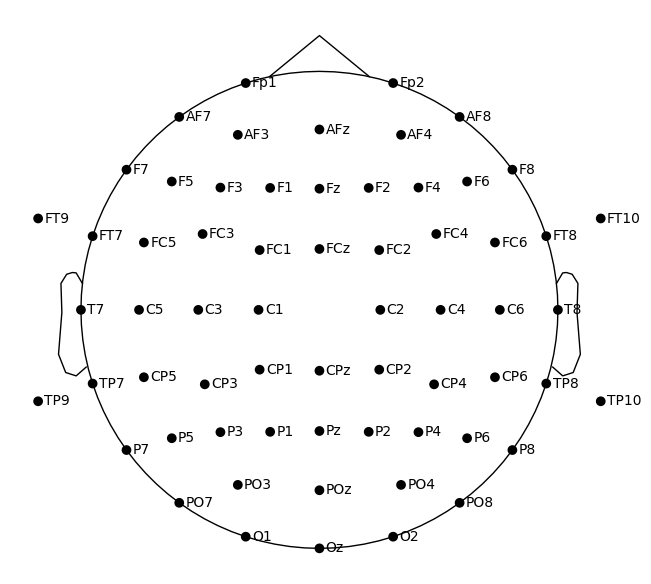

In [6]:
raw.plot_sensors(show_names=True, sphere="eeglab")

In [7]:
# Crop the Block1 ; if required 

"""events,event_dict = mne.events_from_annotations(raw)

# Define the event ID for segmentation
segment_event_id = 11  # Replace with your actual event ID

# Find indices of segment events
segment_indices = np.where(events[:, 2] == segment_event_id)[0]

# Crop the data between each pair of segment events
cropped_data = []
for i in range(len(segment_indices) - 1):
    start_time = events[segment_indices[i], 0] / raw.info['sfreq']
    end_time = events[segment_indices[i+1], 0] / raw.info['sfreq']
    segment = raw.copy().crop(tmin=start_time, tmax=end_time)
    cropped_data.append(segment)

# Concatenate all cropped segments
if cropped_data:
    B1_raw = mne.concatenate_raws(cropped_data)
    print(f"Data cropped to {len(cropped_data)} segments")
else:
    print("No segments found")
    B1_raw = raw
B1_raw.plot(scalings=dict(eeg=40e-6),clipping='transparent',duration=30.0, start=690.0, n_channels=63,color = "Blue" )"""

'events,event_dict = mne.events_from_annotations(raw)\n\n# Define the event ID for segmentation\nsegment_event_id = 11  # Replace with your actual event ID\n\n# Find indices of segment events\nsegment_indices = np.where(events[:, 2] == segment_event_id)[0]\n\n# Crop the data between each pair of segment events\ncropped_data = []\nfor i in range(len(segment_indices) - 1):\n    start_time = events[segment_indices[i], 0] / raw.info[\'sfreq\']\n    end_time = events[segment_indices[i+1], 0] / raw.info[\'sfreq\']\n    segment = raw.copy().crop(tmin=start_time, tmax=end_time)\n    cropped_data.append(segment)\n\n# Concatenate all cropped segments\nif cropped_data:\n    B1_raw = mne.concatenate_raws(cropped_data)\n    print(f"Data cropped to {len(cropped_data)} segments")\nelse:\n    print("No segments found")\n    B1_raw = raw\nB1_raw.plot(scalings=dict(eeg=40e-6),clipping=\'transparent\',duration=30.0, start=690.0, n_channels=63,color = "Blue" )'

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 33001 samples (33.001 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    2.5s


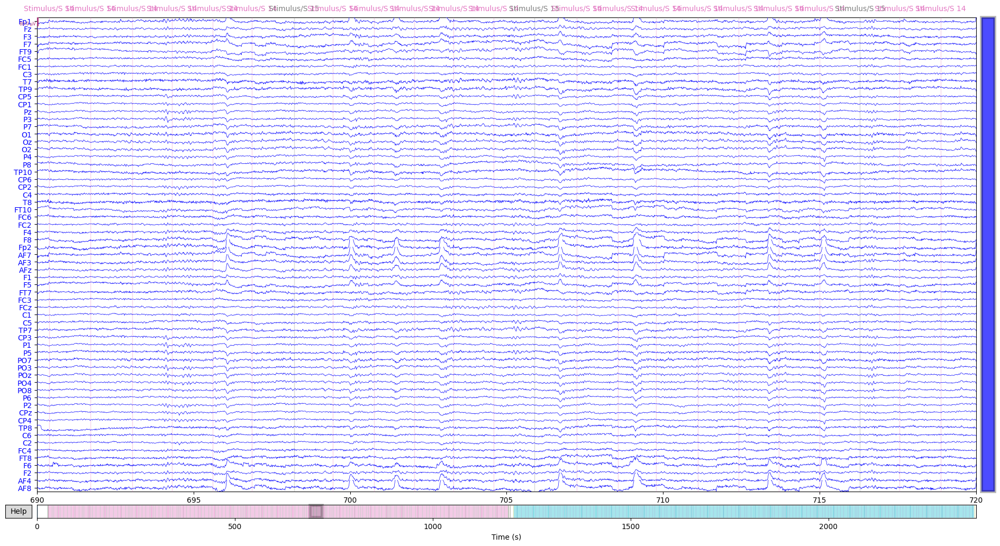

In [37]:
# Now re-reference the data :-n average reference 
raw.set_eeg_reference('average')
# filter 
raw.filter(l_freq=0.1,h_freq=40)

raw.plot(scalings=dict(eeg=40e-6),clipping='transparent',duration=30.0, start=690.0, n_channels=63,color = "Blue" )

Fitting ICA to data using 63 channels (please be patient, this may take a while)
Selecting by number: 20 components
Fitting ICA took 59.6s.


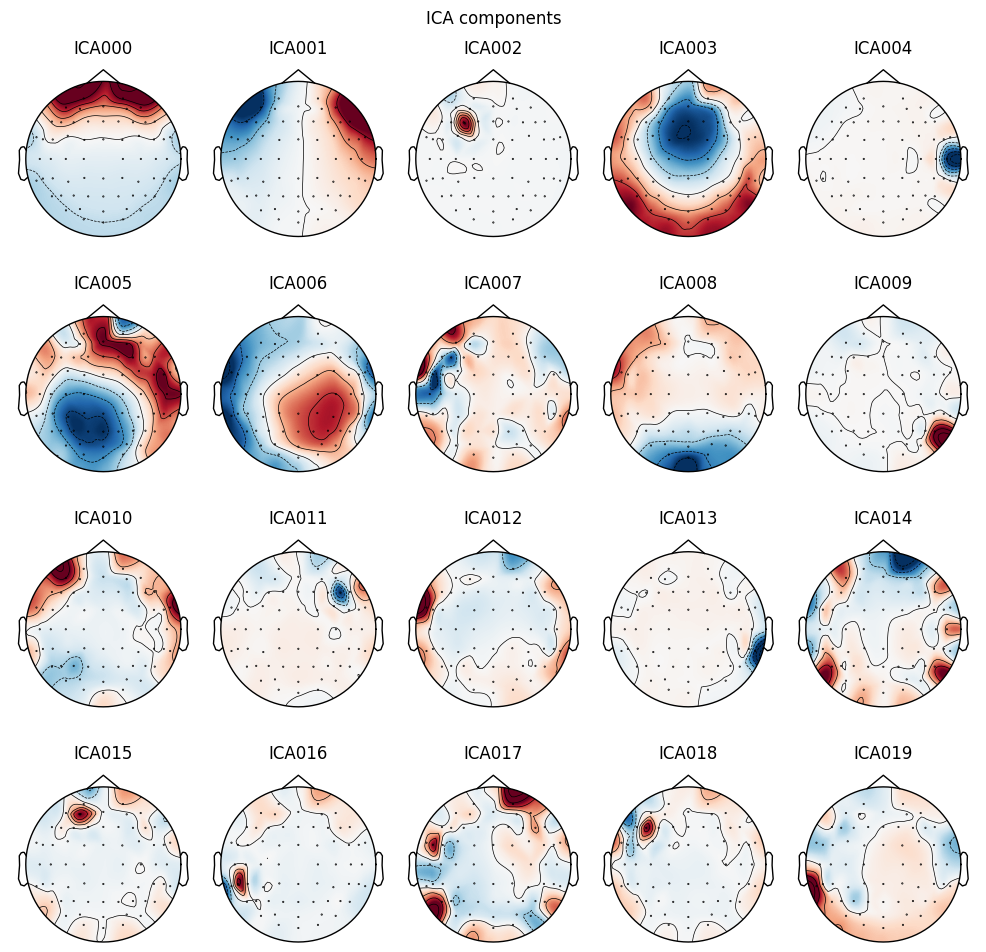

In [38]:

# Set up and fit ICA

ica = ICA(n_components=20, random_state=97)
ica.fit(raw)
ica.plot_components()

In [39]:
ica.plot_properties(raw, picks=range(0,10))

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
1186 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1186 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1186 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1186 matching events found
No baseline correction applied
0 projection items activated


c:\Users\PRAKASH\AppData\Local\anaconda3\envs\EEG_analysis\Lib\site-packages\mne\viz\ica.py:177: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize, facecolor=[0.95] * 3)


Not setting metadata
1186 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1186 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1186 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1186 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1186 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1186 matching events found
No baseline correction applied
0 projection items activated


[<Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>]

Channels marked as bad:
none


Using EOG channels: Fp1, Fp2, F7, F8, AF7, AF8
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    2.0s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 s)

... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 s

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    2.0s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 s)

... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 s

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    2.0s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 s)

... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 s

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    2.0s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 s)

... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 s

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    2.1s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 s)

... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 s

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    2.0s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 s)

[0, 1] [array([ 0.9738626 , -0.15111643, -0.02426318, -0.10767847,  0.03194503,
        0.1710867 , -0.13247628,  0.05032454,  0.09990315,  0.0220578 ,
        0.05594328,  0.04733742, -0.00357635,  0.0206222 , -0.00855892,
        0.10570245, -0.00512063,  0.00183423,  0.01677308, -0.09414804]), array([ 0.97944184,  0.09567764, -0.02923934, -0.1134141 ,  0.0295562 ,
        0.21138293, -0.09455339,  0.06945092,  0.09061071,  0.02848207,
        0.01333196,  0.00731772, -0.00470521,  0.03

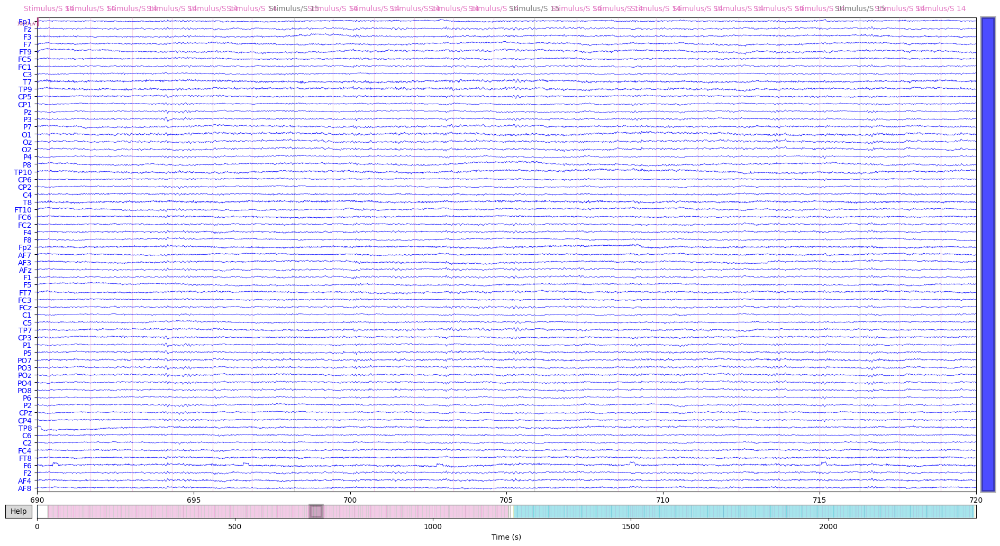

In [40]:
#removing Eye movement artifacts
eog_channels = ['Fp1', 'Fp2', 'F7', 'F8',"AF7",'AF8']  # Adjust these to match your channel names
eog_indices, eog_scores = ica.find_bads_eog(raw, ch_name=eog_channels)
print(eog_indices, eog_scores)
ica.exclude = eog_indices
ica.apply(raw)
raw.plot(scalings=dict(eeg=50e-6),clipping='transparent',duration=30.0, start=690.0, n_channels=63,color = "Blue" )

In [53]:
plt.figure()
plt.scatter(np.mean(raw.get_data(['F1',"F2","FCz","AFz"]),axis=0),raw.get_data(['Fz']),alpha=.5,s =1)
plt.show()

Applying ICA to Raw instance
    Transforming to ICA space (20 components)
    Zeroing out 2 ICA components
    Projecting back using 63 PCA components


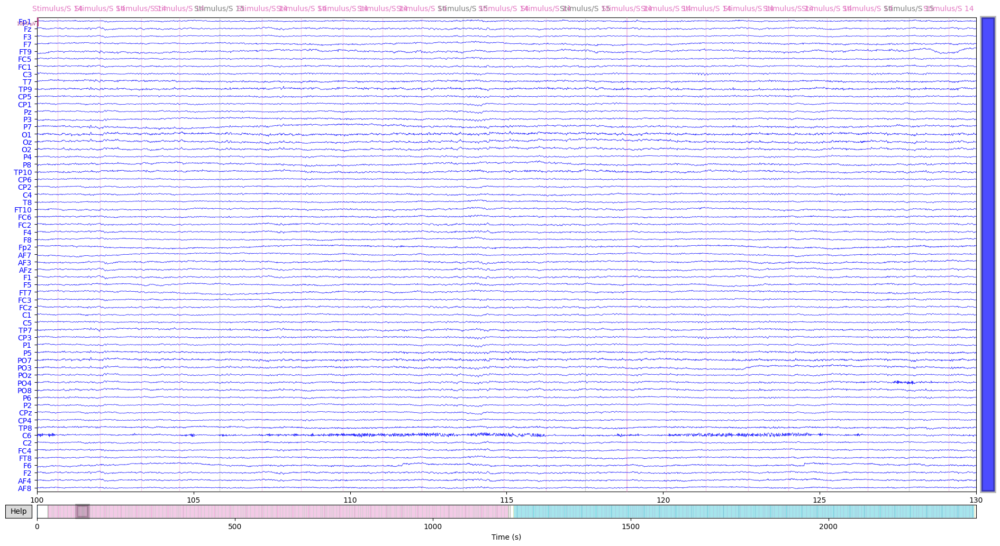

In [12]:
# remvoe line noise
ica.exclude = [2,4]
ica.apply(raw)
raw.plot(scalings=dict(eeg=50e-6),duration=30.0, start=100.0, n_channels=63,color = "Blue" )

Applying ICA to Raw instance
    Transforming to ICA space (20 components)
    Zeroing out 4 ICA components
    Projecting back using 63 PCA components


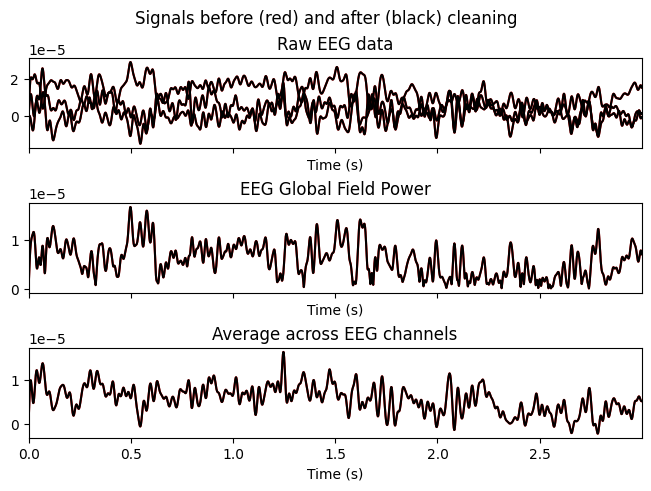

In [13]:
ica.plot_overlay(raw, exclude=[0,1], picks=[ 'Pz', 'AF3',"F2"])
#mne.viz.plot_ica_overlay(ica,raw,exclude=[0,1], picks=[ 'Pz', 'Fz'])

In [14]:
events,event_dict = mne.events_from_annotations(raw)

epochs = mne.Epochs(raw, events, event_id=[14,15],baseline=(None, 0), tmin=-0.300, tmax=0.700, preload=True)
fig = epochs.plot(events=events,
                     scalings=dict(eeg=20e-6),
                     n_channels=63,
                     n_epochs=50,
                  )

Used Annotations descriptions: ['Comment/Active Shielding: On', 'New Segment/', 'Stimulus/S 11', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 21', 'Stimulus/S 24', 'Stimulus/S 25']
Not setting metadata
900 matching events found
Setting baseline interval to [-0.3, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 900 events and 1001 original time points ...
0 bad epochs dropped


In [15]:


# Define your MMN channels
mmn_channels = ['F3', 'Fz', 'F4',]  # Example MMN channels, adjust as needed

# Remove epochs with bad MMN channels
cleaned_epochs = remove_epochs_with_bad_mmn_channels(epochs, mmn_channels)

print(f"Original number of epochs: {len(epochs)}")
print(f"Number of epochs after removal: {len(cleaned_epochs)}")

C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_30088\2095209890.py:24: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  data = epochs.get_data()


Original number of epochs: 900
Number of epochs after removal: 897


In [55]:
B1_devi_eps = cleaned_epochs['15'].average()
B1_sta_eps = cleaned_epochs["14"].average()
B1_MMN_erp = mne.combine_evoked([ B1_devi_eps,B1_sta_eps], weights=[1,-1])


evokeds = dict(B1_MMN_erp =B1_MMN_erp, B1_devi_eps= B1_devi_eps,B1_sta_eps=B1_sta_eps)  
#picks = [n for n in range(1, 5)]
picks= [ 'Fz']
mne.viz.plot_compare_evokeds(evokeds, picks=picks, combine="mean")

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_30088\3765902779.py:9: RuntimeWarning: Only 1 channel in "picks"; cannot combine by method "mean".
  mne.viz.plot_compare_evokeds(evokeds, picks=picks, combine="mean")


[<Figure size 800x600 with 2 Axes>]

Channels marked as bad:
none
Channels marked as bad:
none
Dropped 0 epochs: 
The following epochs were marked as bad and are dropped:
[]
Channels marked as bad:
none
Channels marked as bad:
none


In [17]:
"""The script will now produce  plots:

1 ) A heatmap of t-values across time and channels
2 ) The MMN plot with significant time points highlighted.
"""
from scipy import stats
# Calculate the mean across trials for each condition
data_standard = cleaned_epochs['14'].get_data()
data_deviant = cleaned_epochs['15'].get_data()
mean_standard = np.mean(data_standard, axis=0)
mean_deviant = np.mean(data_deviant, axis=0)

# Perform t-test at each time point and channel
t_values, p_values = stats.ttest_ind(data_standard, data_deviant, axis=0)

# Plot t-values
plt.figure(figsize=(10, 6))
plt.imshow(t_values, aspect='auto', extent=[cleaned_epochs.times[0], cleaned_epochs.times[-1], 0, t_values.shape[0]], 
           cmap='RdBu_r', vmin=-5, vmax=5)
plt.colorbar(label='t-value')
plt.xlabel('Time (s)')
plt.ylabel('Channels')
plt.title('SD031 T-values: Deviant vs Standard')
plt.show()

# Plot significant time points
sig_times = cleaned_epochs.times[np.any(p_values < 0.05, axis=0)]
plt.figure(figsize=(10, 6))
for time in sig_times:
    plt.axvline(x=time, color='r', linestyle='--', alpha=0.5)
plt.plot(cleaned_epochs.times, B1_MMN_erp.data.T)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('SD031 MMN with Significant Time Points')
plt.show()


C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_30088\2096767751.py:8: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  data_standard = cleaned_epochs['14'].get_data()
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_30088\2096767751.py:9: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  data_deviant = cleaned_epochs['15'].get_data()
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_30088\2096767751.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10, 6))


### Sub030

Extracting parameters from D:\Work_data\Notification_evoked_response\Data_at_IITD/SD030\EEG\SD030.vhdr...
Setting channel info structure...
Reading 0 ... 2433639  =      0.000 ...  2433.639 secs...


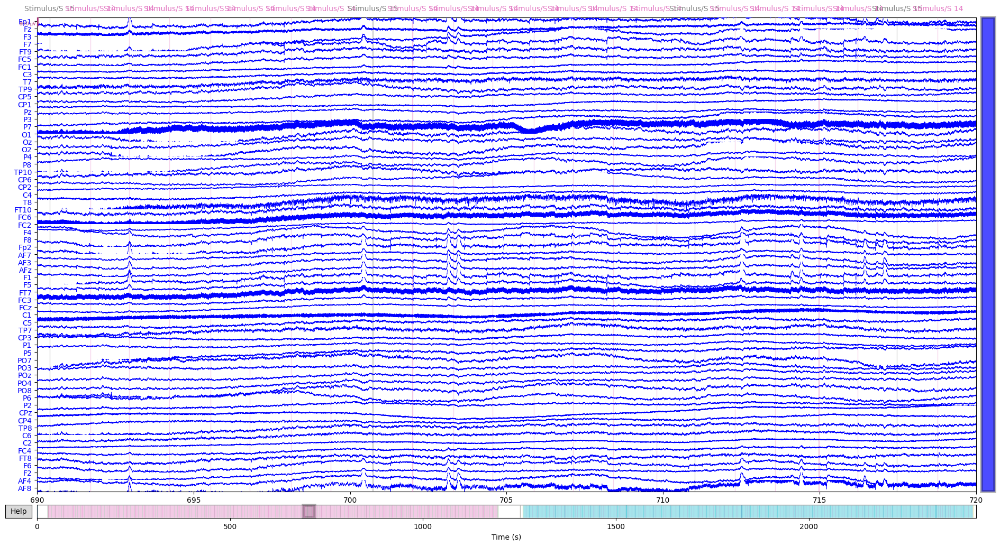

In [18]:
subject = "SD030"
path = os.path.join(data_folder,subject,data_type)
for eeg in os.listdir(path):
    if eeg[-5:] == ".vhdr":
            break
raw = mne.io.read_raw_brainvision(os.path.join(path,eeg), preload=True)
raw.set_montage("easycap-M1")
raw.plot(scalings=dict(eeg=40e-6),clipping='transparent',duration=30.0, start=690.0, n_channels=63,color = "Blue",event_color ='black',show_options=True )

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 33001 samples (33.001 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    2.0s


Fitting ICA to data using 63 channels (please be patient, this may take a while)
Selecting by number: 20 components
Fitting ICA took 49.0s.


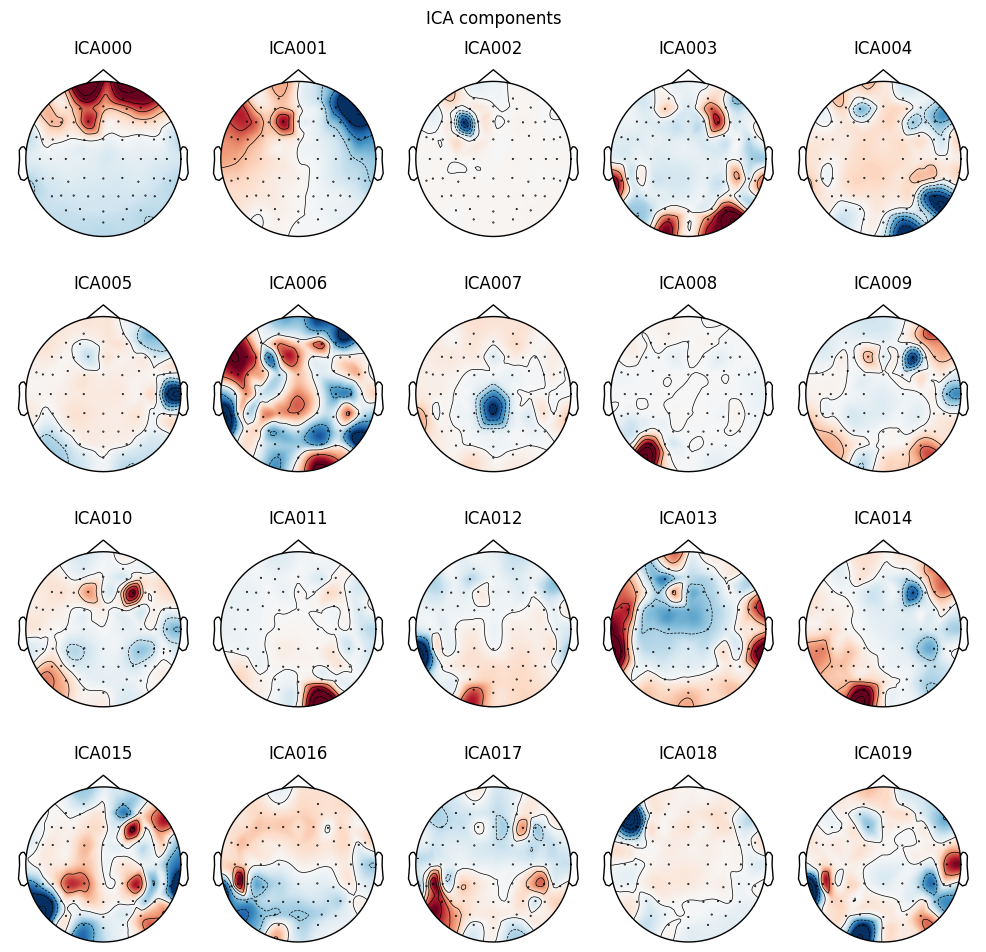

In [19]:
# Now re-reference the data :-n average reference 
raw.set_eeg_reference('average')
# filter 
raw.filter(l_freq=0.1,h_freq=40)

#ICA 
ica = ICA(n_components=20, random_state=97)
ica.fit(raw)
ica.plot_components()


Using EOG channels: Fp1, Fp2, F7, F8, AF7, AF8
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    2.0s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 s)

... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 s

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.9s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 s)

... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 s

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.9s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 s)

... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 s

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.9s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 s)

... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 s

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.9s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 s)

... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 s

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.9s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 s)

[0, 1] [array([ 0.98348536,  0.08426591,  0.00896948, -0.04483623,  0.02351303,
        0.06658581,  0.03639404,  0.11633676,  0.03806737, -0.04960324,
        0.07678126, -0.08441888, -0.11061618, -0.01571231, -0.00942175,
       -0.04007391,  0.11858425, -0.11826971,  0.13899492,  0.05080905]), array([ 9.89580081e-01, -1.25628124e-01,  1.49276492e-02, -2.93735750e-02,
        5.03852137e-02,  1.48998155e-02, -9.34600366e-04,  9.27350067e-02,
        2.88167101e-02, -1.37542948e-02,  1.0

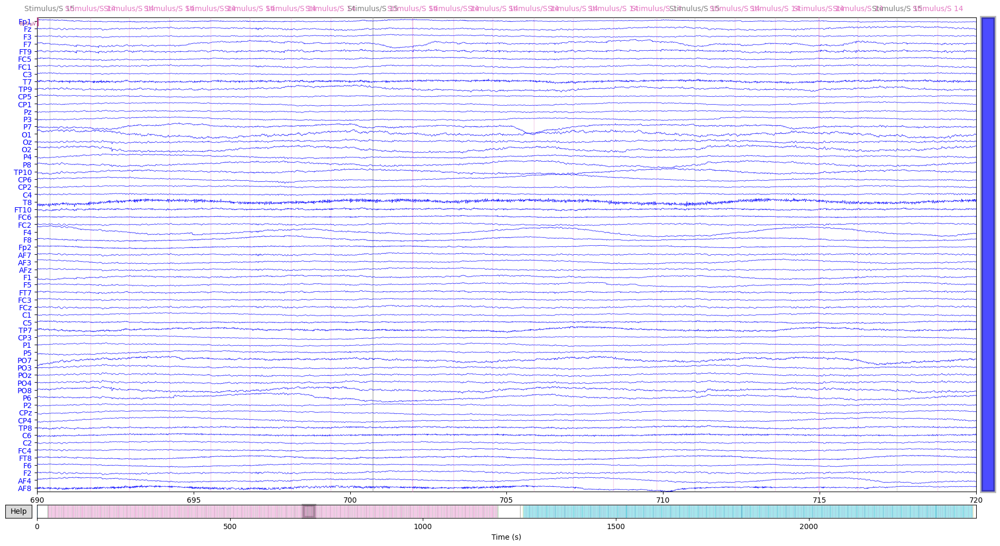

In [20]:
#removing Eye movement artifacts
eog_channels = ['Fp1', 'Fp2', 'F7', 'F8',"AF7",'AF8']  # Adjust these to match your channel names
eog_indices, eog_scores = ica.find_bads_eog(raw, ch_name=eog_channels)
print(eog_indices, eog_scores)
ica.exclude = eog_indices
ica.apply(raw)
# remvoe line noise
ica.exclude = [2]
ica.apply(raw)
raw.plot(scalings=dict(eeg=50e-6),duration=30.0, start=100.0, n_channels=63,color = "Blue" )

raw.plot(scalings=dict(eeg=40e-6),clipping='transparent',duration=30.0, start=690.0, n_channels=63,color = "Blue" )

In [21]:
events,event_dict = mne.events_from_annotations(raw)

epochs = mne.Epochs(raw, events, event_id=[14,15],baseline=(None, 0), tmin=-0.300, tmax=0.700, preload=True)
fig = epochs.plot(events=events,
                     scalings=dict(eeg=20e-6),
                     n_channels=63,
                     n_epochs=50,
                  )
# Define your MMN channels
mmn_channels = ['F3', 'Fz', 'F4',]  # Example MMN channels, adjust as needed

# Remove epochs with bad MMN channels
cleaned_epochs = remove_epochs_with_bad_mmn_channels(epochs, mmn_channels)

print(f"Original number of epochs: {len(epochs)}")
print(f"Number of epochs after removal: {len(cleaned_epochs)}")

## ERP 
B1_devi_eps = cleaned_epochs['15'].average()
B1_sta_eps = cleaned_epochs["14"].average()
B1_MMN_erp = mne.combine_evoked([ B1_devi_eps,B1_sta_eps], weights=[1,-1])


evokeds = dict(B1_MMN_erp =B1_MMN_erp, B1_devi_eps= B1_devi_eps,B1_sta_eps=B1_sta_eps)  
#picks = [n for n in range(1, 5)]
picks= ['F3', 'Fz', 'F4',]
mne.viz.plot_compare_evokeds(evokeds, picks=picks,title  = "SD030 on avaerage 'F3', 'Fz', 'F4'", combine="mean")


# Calculate the mean across trials for each condition
data_standard = cleaned_epochs['14'].get_data()
data_deviant = cleaned_epochs['15'].get_data()
mean_standard = np.mean(data_standard, axis=0)
mean_deviant = np.mean(data_deviant, axis=0)

# Perform t-test at each time point and channel
t_values, p_values = stats.ttest_ind(data_standard, data_deviant, axis=0)

# Plot t-values
plt.figure(figsize=(10, 6))
plt.imshow(t_values, aspect='auto', extent=[cleaned_epochs.times[0], cleaned_epochs.times[-1], 0, t_values.shape[0]], 
           cmap='RdBu_r', vmin=-5, vmax=5)
plt.colorbar(label='t-value')
plt.xlabel('Time (s)')
plt.ylabel('Channels')
plt.title('SD030 T-values: Deviant vs Standard')
plt.show()

# Plot significant time points
sig_times = cleaned_epochs.times[np.any(p_values < 0.05, axis=0)]
plt.figure(figsize=(10, 6))
for time in sig_times:
    plt.axvline(x=time, color='r', linestyle='--', alpha=0.5)
plt.plot(cleaned_epochs.times, B1_MMN_erp.data.T)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('SD030 MMN with Significant Time Points')
plt.show()


Used Annotations descriptions: ['Comment/Active Shielding: On', 'New Segment/', 'Stimulus/S 11', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 21', 'Stimulus/S 24', 'Stimulus/S 25']
Not setting metadata
900 matching events found
Setting baseline interval to [-0.3, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 900 events and 1001 original time points ...
0 bad epochs dropped


C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_30088\2095209890.py:24: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  data = epochs.get_data()


Original number of epochs: 900
Number of epochs after removal: 895
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_30088\1793036016.py:31: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  data_standard = cleaned_epochs['14'].get_data()
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_30088\1793036016.py:32: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  data_deviant = cleaned_epochs['15'].get_data()


### SD025

Extracting parameters from D:\Work_data\Notification_evoked_response\Data_at_IITD/SD025\EEG\SD025.vhdr...
Setting channel info structure...
Reading 0 ... 2372779  =      0.000 ...  2372.779 secs...


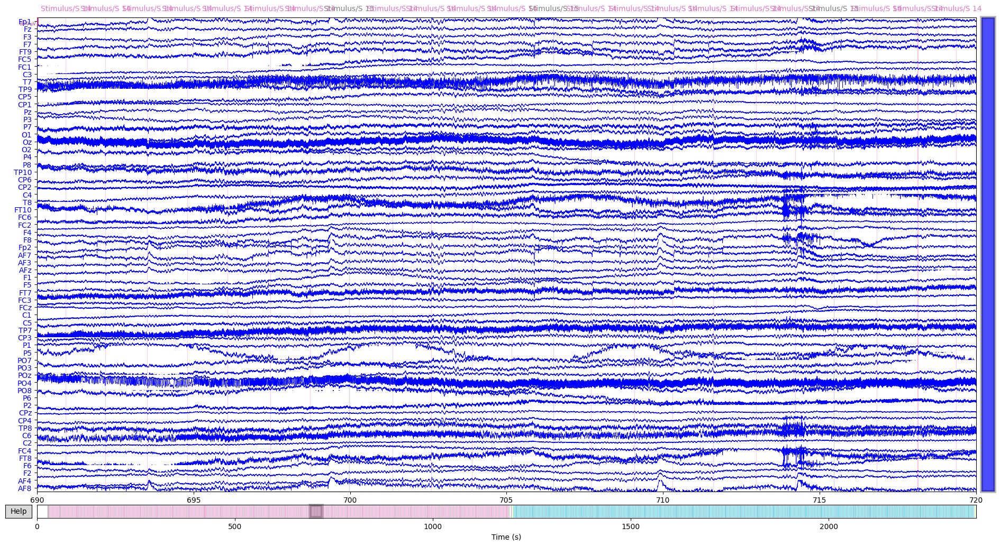

In [22]:
subject = "SD025"
path = os.path.join(data_folder,subject,data_type)
for eeg in os.listdir(path):
    if eeg[-5:] == ".vhdr":
            break
raw = mne.io.read_raw_brainvision(os.path.join(path,eeg), preload=True)
raw.set_montage("easycap-M1")
raw.plot(scalings=dict(eeg=40e-6),clipping='transparent',duration=30.0, start=690.0, n_channels=63,color = "Blue",event_color ='black',show_options=True )

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 33001 samples (33.001 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.9s


Fitting ICA to data using 63 channels (please be patient, this may take a while)
Selecting by number: 20 components
Fitting ICA took 42.6s.


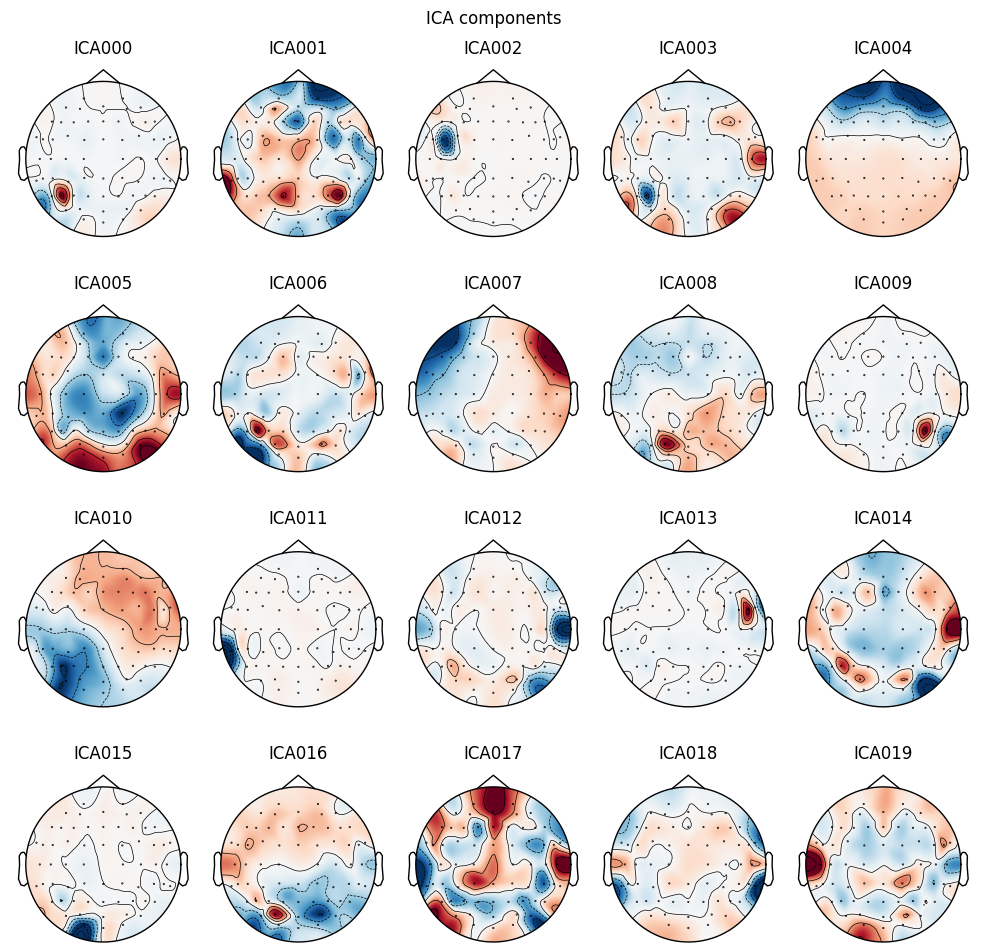

In [23]:
# Now re-reference the data :-n average reference 
raw.set_eeg_reference('average')
# filter 
raw.filter(l_freq=0.1,h_freq=40)

raw.plot(scalings=dict(eeg=40e-6),clipping='transparent',duration=30.0, start=690.0, n_channels=63,color = "Blue",event_color ='black',show_options=True )
#ICA 
ica = ICA(n_components=20, random_state=97)
ica.fit(raw)
ica.plot_components()


Using EOG channels: Fp1, Fp2, F7, F8, AF7, AF8
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.9s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 s)

... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 s

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.8s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 s)

... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 s

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.8s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 s)

... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 s

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.8s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 s)

... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 s

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.8s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 s)

... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 s

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.8s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 s)

[4, 1] [array([ 0.01228871, -0.14104196, -0.00985984,  0.11241626, -0.93659509,
       -0.02586299,  0.00268227, -0.19178413, -0.28672027,  0.0044163 ,
        0.17060783, -0.01614744, -0.04803195, -0.02047434, -0.00515736,
       -0.02966934,  0.25821778,  0.15428556, -0.0290418 ,  0.01437033]), array([ 0.05597886, -0.39943522,  0.01421246,  0.09069142, -0.90117136,
       -0.01167967, -0.00974841,  0.0447011 , -0.19441134,  0.01360653,
        0.19369688, -0.04943473, -0.02721034, -0.03

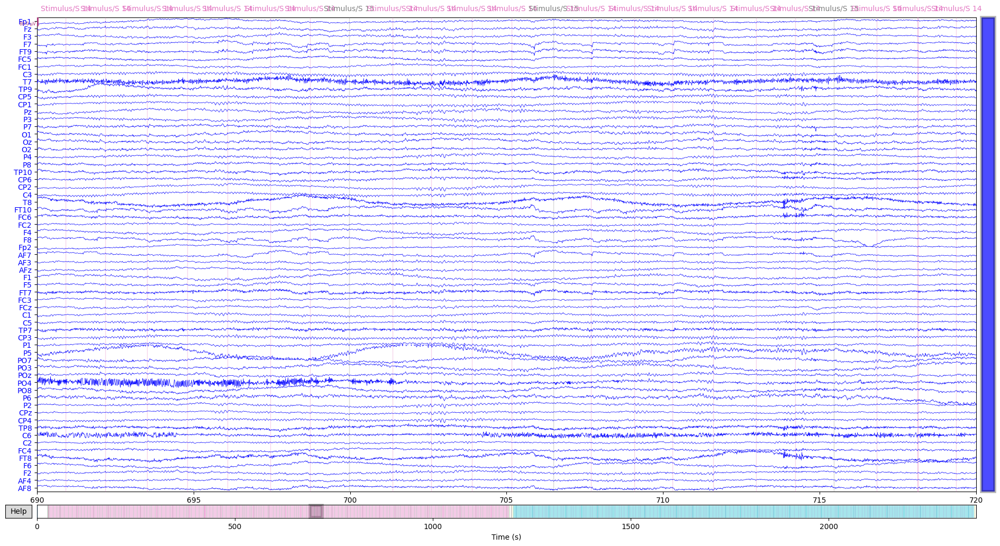

In [24]:
#removing Eye movement artifacts
eog_channels = ['Fp1', 'Fp2', 'F7', 'F8',"AF7",'AF8']  # Adjust these to match your channel names
eog_indices, eog_scores = ica.find_bads_eog(raw, ch_name=eog_channels)
print(eog_indices, eog_scores)
ica.exclude = eog_indices
ica.apply(raw)
# remvoe line noise
ica.exclude = [0, 2]
ica.apply(raw)

raw.plot(scalings=dict(eeg=40e-6),clipping='transparent',duration=30.0, start=690.0, n_channels=63,color = "Blue" )

In [25]:
events,event_dict = mne.events_from_annotations(raw)

epochs = mne.Epochs(raw, events, event_id=[14,15],baseline=(None, 0), tmin=-0.300, tmax=0.700, preload=True)
fig = epochs.plot(events=events,
                     scalings=dict(eeg=20e-6),
                     n_channels=63,
                     n_epochs=50,
                  )
# Define your MMN channels
mmn_channels = ['F3', 'Fz', 'F4',]  # Example MMN channels, adjust as needed

# Remove epochs with bad MMN channels
cleaned_epochs = remove_epochs_with_bad_mmn_channels(epochs, mmn_channels)

print(f"Original number of epochs: {len(epochs)}")
print(f"Number of epochs after removal: {len(cleaned_epochs)}")

## ERP 
B1_devi_eps = cleaned_epochs['15'].average()
B1_sta_eps = cleaned_epochs["14"].average()
B1_MMN_erp = mne.combine_evoked([ B1_devi_eps,B1_sta_eps], weights=[1,-1])


evokeds = dict(B1_MMN_erp =B1_MMN_erp, B1_devi_eps= B1_devi_eps,B1_sta_eps=B1_sta_eps)  
#picks = [n for n in range(1, 5)]
picks= ['F3', 'Fz', 'F4',]
mne.viz.plot_compare_evokeds(evokeds, picks=picks,title  = "SD025 on avaerage 'F3', 'Fz', 'F4'", combine="mean")


# Calculate the mean across trials for each condition
data_standard = cleaned_epochs['14'].get_data()
data_deviant = cleaned_epochs['15'].get_data()
mean_standard = np.mean(data_standard, axis=0)
mean_deviant = np.mean(data_deviant, axis=0)

# Perform t-test at each time point and channel
t_values, p_values = stats.ttest_ind(data_standard, data_deviant, axis=0)

# Plot t-values
plt.figure(figsize=(10, 6))
plt.imshow(t_values, aspect='auto', extent=[cleaned_epochs.times[0], cleaned_epochs.times[-1], 0, t_values.shape[0]], 
           cmap='RdBu_r', vmin=-5, vmax=5)
plt.colorbar(label='t-value')
plt.xlabel('Time (s)')
plt.ylabel('Channels')
plt.title('SD025 T-values: Deviant vs Standard')
plt.show()

# Plot significant time points
sig_times = cleaned_epochs.times[np.any(p_values < 0.05, axis=0)]
plt.figure(figsize=(10, 6))
for time in sig_times:
    plt.axvline(x=time, color='r', linestyle='--', alpha=0.5)
plt.plot(cleaned_epochs.times, B1_MMN_erp.data.T)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('SD025 MMN with Significant Time Points')
plt.show()

Used Annotations descriptions: ['Comment/Active Shielding: On', 'New Segment/', 'Stimulus/S 11', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 21', 'Stimulus/S 24', 'Stimulus/S 25']
Not setting metadata
900 matching events found
Setting baseline interval to [-0.3, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 900 events and 1001 original time points ...
0 bad epochs dropped


C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_30088\2095209890.py:24: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  data = epochs.get_data()


Original number of epochs: 900
Number of epochs after removal: 899
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_30088\4276981237.py:31: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  data_standard = cleaned_epochs['14'].get_data()
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_30088\4276981237.py:32: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  data_deviant = cleaned_epochs['15'].get_data()


### SD020

Extracting parameters from D:\Work_data\Notification_evoked_response\Data_at_IITD/SD020\EEG\SD020.vhdr...
Setting channel info structure...
Reading 0 ... 2535859  =      0.000 ...  2535.859 secs...


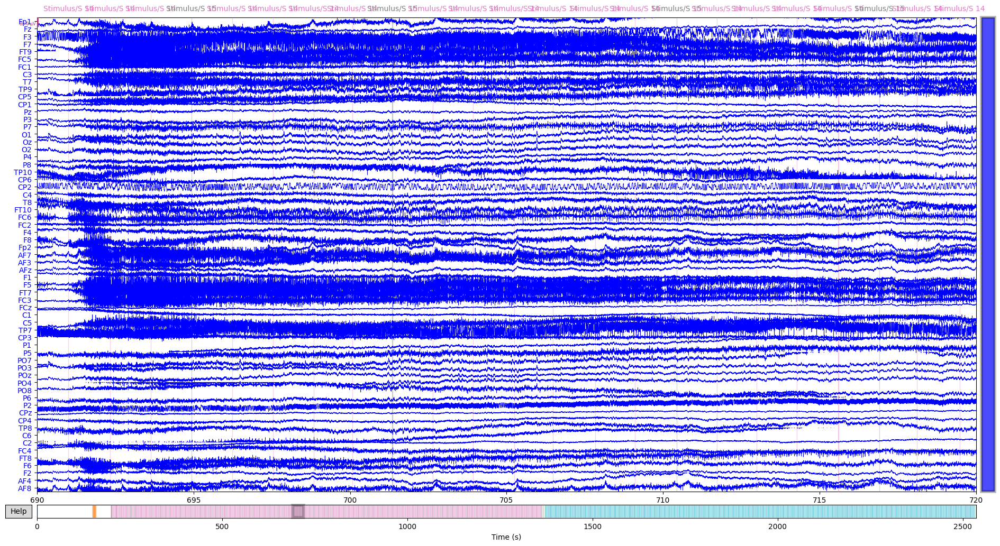

In [26]:
subject = "SD020"
path = os.path.join(data_folder,subject,data_type)
for eeg in os.listdir(path):
    if eeg[-5:] == ".vhdr":
            break
raw = mne.io.read_raw_brainvision(os.path.join(path,eeg), preload=True)
raw.set_montage("easycap-M1")
raw.plot(scalings=dict(eeg=40e-6),clipping='transparent',duration=30.0, start=690.0, n_channels=63,color = "Blue",event_color ='black',show_options=True )

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 33001 samples (33.001 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    2.2s


Fitting ICA to data using 63 channels (please be patient, this may take a while)
Selecting by number: 20 components
Fitting ICA took 58.1s.


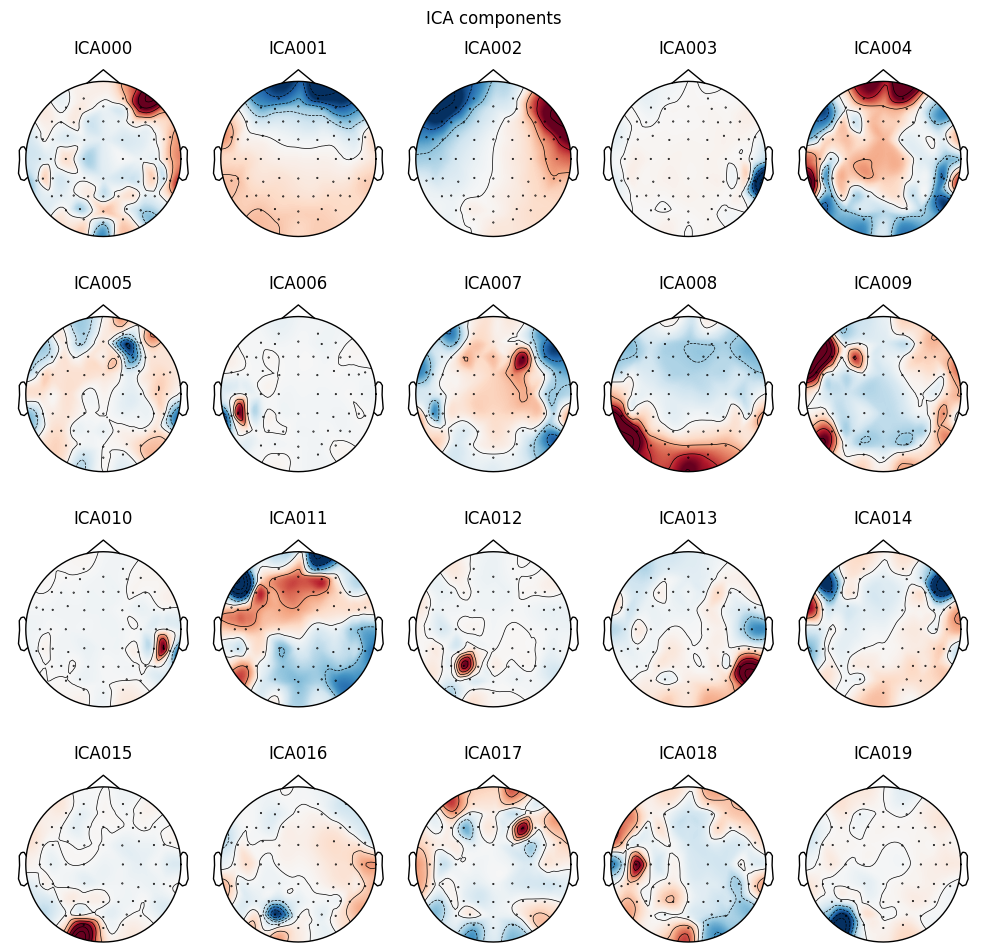

In [27]:
# Now re-reference the data :-n average reference 
raw.set_eeg_reference('average')
# filter 
raw.filter(l_freq=0.1,h_freq=40)

raw.plot(scalings=dict(eeg=40e-6),clipping='transparent',duration=30.0, start=690.0, n_channels=63,color = "Blue",event_color ='black',show_options=True )
#ICA 
ica = ICA(n_components=20, random_state=97)
ica.fit(raw)
ica.plot_components()


Using EOG channels: Fp1, Fp2, F7, F8, AF7, AF8
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    2.0s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 s)

... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 s

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    2.0s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 s)

... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 s

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    2.0s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 s)

... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 s

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    2.0s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 s)

... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 s

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    2.0s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 s)

... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 s

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.9s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 s)

[1, 0] [array([ 0.07669216, -0.91465833, -0.47968604, -0.04283443, -0.05452515,
       -0.13728706, -0.01087085, -0.09100252, -0.18723308,  0.20783574,
        0.11436259,  0.23403045, -0.07702446, -0.1780622 , -0.0543209 ,
       -0.00835084,  0.02870662,  0.19974847,  0.07223732,  0.03828483]), array([ 0.22235135, -0.95346689, -0.19748314, -0.04227746, -0.05821167,
       -0.18466142, -0.00790107, -0.06733731, -0.21431152,  0.21456388,
        0.10400118,  0.1795285 , -0.08649498, -0.14

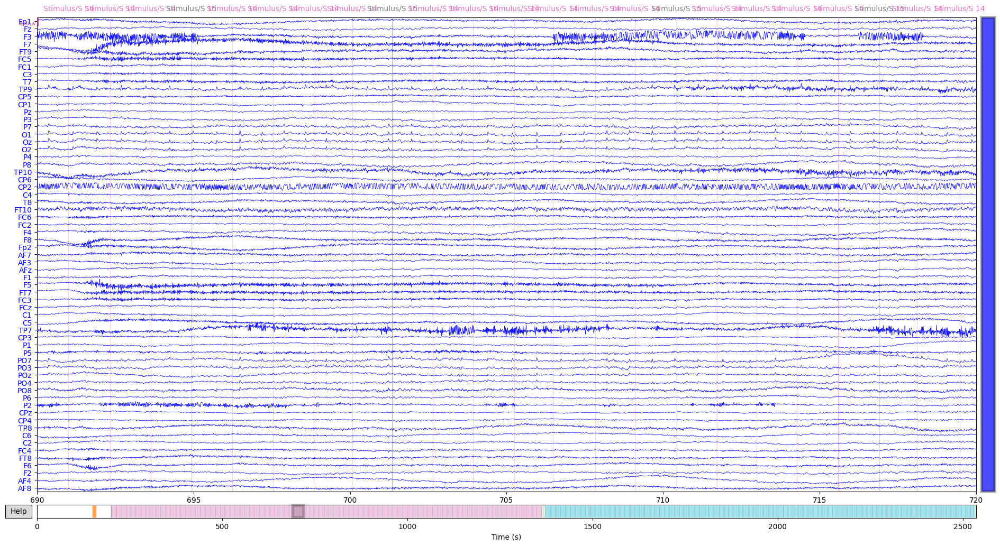

In [28]:
#removing Eye movement artifacts
eog_channels = ['Fp1', 'Fp2', 'F7', 'F8',"AF7",'AF8']  # Adjust these to match your channel names
eog_indices, eog_scores = ica.find_bads_eog(raw, ch_name=eog_channels)
print(eog_indices, eog_scores)
ica.exclude = eog_indices
ica.apply(raw)
# remvoe channel noise
ica.exclude = [ 2]
ica.apply(raw)

raw.plot(scalings=dict(eeg=40e-6),clipping='transparent',duration=30.0, start=690.0, n_channels=63,color = "Blue" )

In [29]:
events,event_dict = mne.events_from_annotations(raw)

epochs = mne.Epochs(raw, events, event_id=[14,15],baseline=(None, 0), tmin=-0.300, tmax=0.700, preload=True)
fig = epochs.plot(events=events,
                     scalings=dict(eeg=20e-6),
                     n_channels=63,
                     n_epochs=50,
                  )
# Define your MMN channels
mmn_channels = ['F3', 'Fz', 'F4',]  # Example MMN channels, adjust as needed

# Remove epochs with bad MMN channels
cleaned_epochs = remove_epochs_with_bad_mmn_channels(epochs, mmn_channels)

print(f"Original number of epochs: {len(epochs)}")
print(f"Number of epochs after removal: {len(cleaned_epochs)}")

## ERP 
B1_devi_eps = cleaned_epochs['15'].average()
B1_sta_eps = cleaned_epochs["14"].average()
B1_MMN_erp = mne.combine_evoked([ B1_devi_eps,B1_sta_eps], weights=[1,-1])


evokeds = dict(B1_MMN_erp =B1_MMN_erp, B1_devi_eps= B1_devi_eps,B1_sta_eps=B1_sta_eps)  
#picks = [n for n in range(1, 5)]
picks= ['F3', 'Fz', 'F4',]
mne.viz.plot_compare_evokeds(evokeds, picks=picks,title  = "SD020 on avaerage 'F3', 'Fz', 'F4'", combine="mean")

# Calculate the mean across trials for each condition
data_standard = cleaned_epochs['14'].get_data()
data_deviant = cleaned_epochs['15'].get_data()
mean_standard = np.mean(data_standard, axis=0)
mean_deviant = np.mean(data_deviant, axis=0)

# Perform t-test at each time point and channel
t_values, p_values = stats.ttest_ind(data_standard, data_deviant, axis=0)

# Plot t-values
plt.figure(figsize=(10, 6))
plt.imshow(t_values, aspect='auto', extent=[cleaned_epochs.times[0], cleaned_epochs.times[-1], 0, t_values.shape[0]], 
           cmap='RdBu_r', vmin=-5, vmax=5)
plt.colorbar(label='t-value')
plt.xlabel('Time (s)')
plt.ylabel('Channels')
plt.title('SD020 T-values: Deviant vs Standard')
plt.show()

# Plot significant time points
sig_times = cleaned_epochs.times[np.any(p_values < 0.05, axis=0)]
plt.figure(figsize=(10, 6))
for time in sig_times:
    plt.axvline(x=time, color='r', linestyle='--', alpha=0.5)
plt.plot(cleaned_epochs.times, B1_MMN_erp.data.T)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('SD020 MMN with Significant Time Points')
plt.show()


Used Annotations descriptions: ['Comment/Active Shielding: On', 'New Segment/', 'Stimulus/S 11', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 21', 'Stimulus/S 24', 'Stimulus/S 25', 'Stimulus/S255']
Not setting metadata
900 matching events found
Setting baseline interval to [-0.3, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 900 events and 1001 original time points ...
0 bad epochs dropped


C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_30088\338124585.py:4: RuntimeWarning: More events than default colors available. You should pass a list of unique colors.
  fig = epochs.plot(events=events,
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_30088\2095209890.py:24: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  data = epochs.get_data()


Original number of epochs: 900
Number of epochs after removal: 791
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_30088\338124585.py:30: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  data_standard = cleaned_epochs['14'].get_data()
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_30088\338124585.py:31: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  data_deviant = cleaned_epochs['15'].get_data()


### SD015

Extracting parameters from D:\Work_data\Notification_evoked_response\Data_at_IITD/SD015\EEG\SD015.vhdr...
Setting channel info structure...
Reading 0 ... 2371899  =      0.000 ...  2371.899 secs...


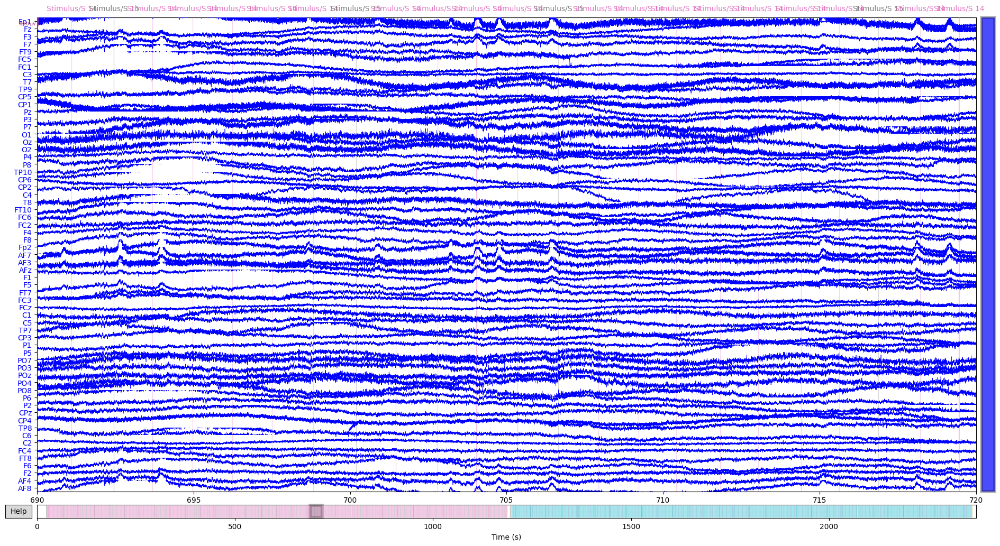

In [30]:
subject = "SD015"
path = os.path.join(data_folder,subject,data_type)
for eeg in os.listdir(path):
    if eeg[-5:] == ".vhdr":
            break
raw = mne.io.read_raw_brainvision(os.path.join(path,eeg), preload=True)
raw.set_montage("easycap-M1")
raw.plot(scalings=dict(eeg=40e-6),clipping='transparent',duration=30.0, start=690.0, n_channels=63,color = "Blue",event_color ='black',show_options=True )

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 33001 samples (33.001 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    2.3s


Fitting ICA to data using 63 channels (please be patient, this may take a while)
Selecting by number: 20 components
Fitting ICA took 99.0s.


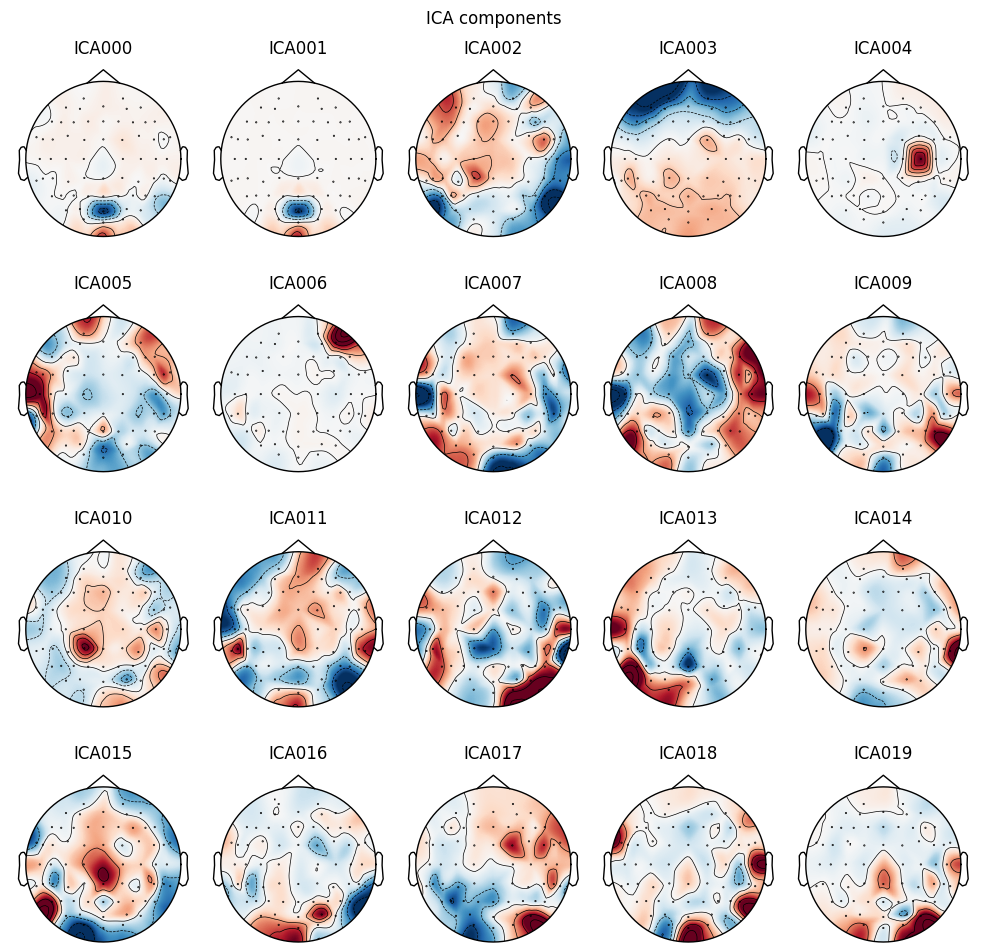

In [32]:
# Now re-reference the data :-n average reference 
raw.set_eeg_reference('average')
# filter 
raw.filter(l_freq=0.1,h_freq=40)

#ICA 
ica = ICA(n_components=20, random_state=97)
ica.fit(raw)
ica.plot_components()

Using EOG channels: Fp1, Fp2, F7, F8, AF7, AF8
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.8s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 s)

... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 s

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.8s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 s)

... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 s

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.8s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 s)

... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 s

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.8s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 s)

... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 s

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.8s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 s)

... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 s

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.8s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 s)

[3] [array([ 0.06071466,  0.0634864 ,  0.18338054, -0.91405874, -0.05305721,
        0.17696076,  0.13148497,  0.19818862, -0.13016939, -0.01450078,
        0.26559203,  0.05255038,  0.05223467,  0.01429628,  0.00554752,
       -0.02819755, -0.01718638,  0.11701321,  0.02429922,  0.00722611]), array([ 0.20473251,  0.06857237,  0.06552415, -0.89532407, -0.00835512,
        0.21324398,  0.31584745,  0.14894024,  0.01913169,  0.01350543,
        0.29152051,  0.16585918, -0.09445625, -0.05240

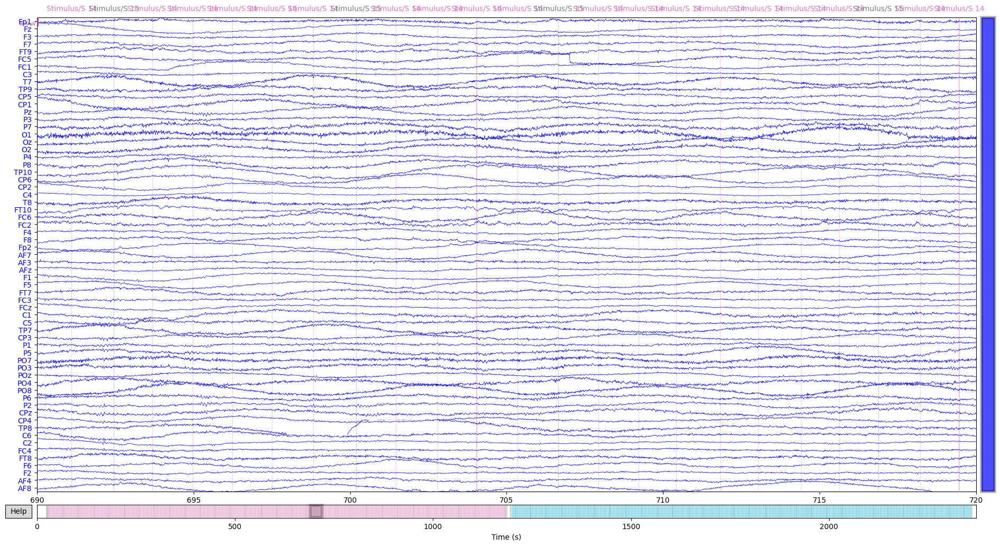

In [33]:
#removing Eye movement artifacts
eog_channels = ['Fp1', 'Fp2', 'F7', 'F8',"AF7",'AF8']  # Adjust these to match your channel names
eog_indices, eog_scores = ica.find_bads_eog(raw, ch_name=eog_channels)
print(eog_indices, eog_scores)
ica.exclude = eog_indices
ica.apply(raw)
# remvoe channel noise
ica.exclude = [0,1,4]
ica.apply(raw)

raw.plot(scalings=dict(eeg=40e-6),clipping='transparent',duration=30.0, start=690.0, n_channels=63,color = "Blue" )

In [34]:
events,event_dict = mne.events_from_annotations(raw)

epochs = mne.Epochs(raw, events, event_id=[14,15],baseline=(None, 0), tmin=-0.300, tmax=0.700, preload=True)
fig = epochs.plot(events=events,
                     scalings=dict(eeg=20e-6),
                     n_channels=63,
                     n_epochs=50,
                  )
# Define your MMN channels
mmn_channels = ['F3', 'Fz', 'F4',]  # Example MMN channels, adjust as needed

# Remove epochs with bad MMN channels
cleaned_epochs = remove_epochs_with_bad_mmn_channels(epochs, mmn_channels)

print(f"Original number of epochs: {len(epochs)}")
print(f"Number of epochs after removal: {len(cleaned_epochs)}")

## ERP 
B1_devi_eps = cleaned_epochs['15'].average()
B1_sta_eps = cleaned_epochs["14"].average()
B1_MMN_erp = mne.combine_evoked([ B1_devi_eps,B1_sta_eps], weights=[1,-1])


evokeds = dict(B1_MMN_erp =B1_MMN_erp, B1_devi_eps= B1_devi_eps,B1_sta_eps=B1_sta_eps)  
#picks = [n for n in range(1, 5)]
picks= ['F3', 'Fz', 'F4',]
mne.viz.plot_compare_evokeds(evokeds, picks=picks,title  = "SD015 on avaerage 'F3', 'Fz', 'F4'", combine="mean")


# Calculate the mean across trials for each condition
data_standard = cleaned_epochs['14'].get_data()
data_deviant = cleaned_epochs['15'].get_data()
mean_standard = np.mean(data_standard, axis=0)
mean_deviant = np.mean(data_deviant, axis=0)

# Perform t-test at each time point and channel
t_values, p_values = stats.ttest_ind(data_standard, data_deviant, axis=0)

# Plot t-values
plt.figure(figsize=(10, 6))
plt.imshow(t_values, aspect='auto', extent=[cleaned_epochs.times[0], cleaned_epochs.times[-1], 0, t_values.shape[0]], 
           cmap='RdBu_r', vmin=-5, vmax=5)
plt.colorbar(label='t-value')
plt.xlabel('Time (s)')
plt.ylabel('Channels')
plt.title('SD015 T-values: Deviant vs Standard')
plt.show()

# Plot significant time points
sig_times = cleaned_epochs.times[np.any(p_values < 0.05, axis=0)]
plt.figure(figsize=(10, 6))
for time in sig_times:
    plt.axvline(x=time, color='r', linestyle='--', alpha=0.5)
plt.plot(cleaned_epochs.times, B1_MMN_erp.data.T)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('SD015 MMN with Significant Time Points')
plt.show()


Used Annotations descriptions: ['Comment/Active Shielding: On', 'New Segment/', 'Stimulus/S 11', 'Stimulus/S 12', 'Stimulus/S 13', 'Stimulus/S 14', 'Stimulus/S 15', 'Stimulus/S 21', 'Stimulus/S 24', 'Stimulus/S 25']
Not setting metadata
900 matching events found
Setting baseline interval to [-0.3, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 900 events and 1001 original time points ...


0 bad epochs dropped


C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_30088\2095209890.py:24: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  data = epochs.get_data()


Original number of epochs: 900
Number of epochs after removal: 900
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_30088\450427933.py:31: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  data_standard = cleaned_epochs['14'].get_data()
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_30088\450427933.py:32: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  data_deviant = cleaned_epochs['15'].get_data()


Channels marked as bad:
none
Channels marked as bad:
none
Channels marked as bad:
none
Channels marked as bad:
none
Dropped 0 epochs: 
The following epochs were marked as bad and are dropped:
[]
Channels marked as bad:
none
Channels marked as bad:
none
Channels marked as bad:
none
Channels marked as bad:
none
Dropped 0 epochs: 
The following epochs were marked as bad and are dropped:
[]
Channels marked as bad:
none
Channels marked as bad:
none
Channels marked as bad:
none
Channels marked as bad:
none
Dropped 0 epochs: 
The following epochs were marked as bad and are dropped:
[]
Channels marked as bad:
none
Channels marked as bad:
none
Channels marked as bad:
none
Channels marked as bad:
none
Dropped 0 epochs: 
The following epochs were marked as bad and are dropped:
[]
Channels marked as bad:
none
